In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
#  pip install pillow
#  pip install tensorflow_datasets
import tensorflow as tf
print(tf.__version__)

2.2.0


In [3]:
import warnings
warnings.filterwarnings("ignore")

import tensorflow_datasets as tfds
tfds.__version__

'3.2.1'

In [4]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

In [5]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


In [6]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

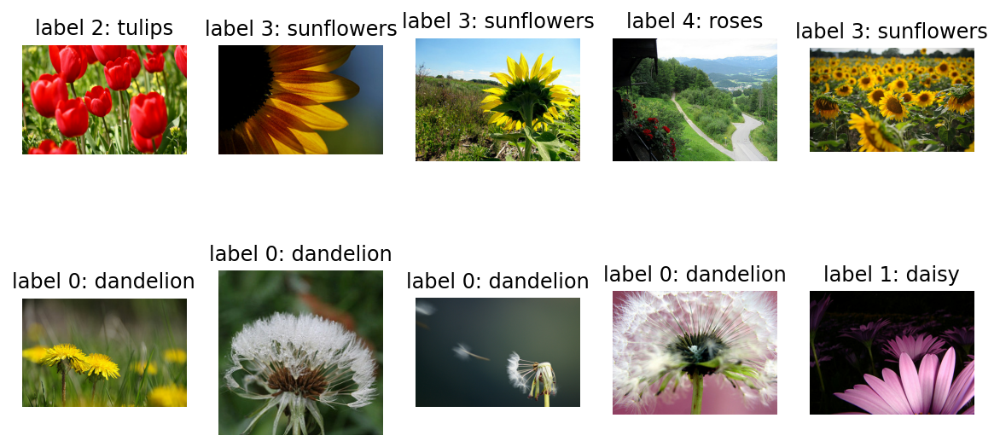

In [7]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [8]:
IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [9]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

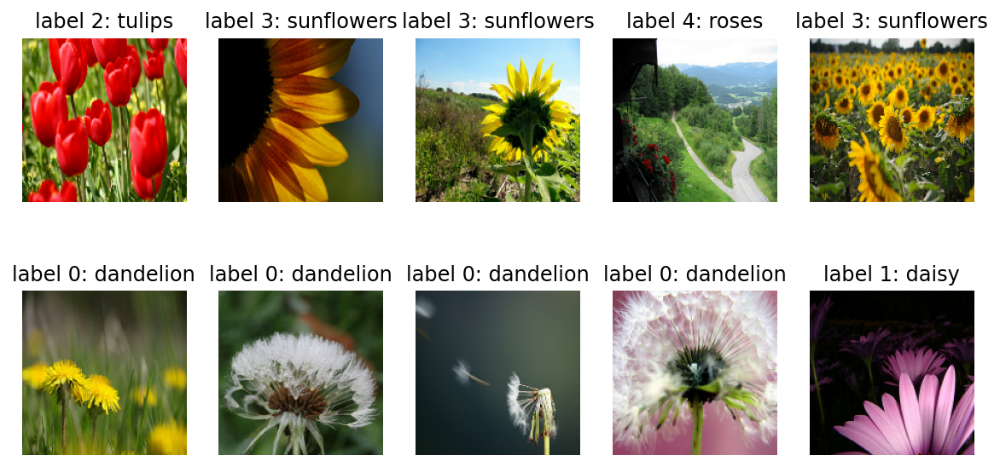

In [10]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [11]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

In [12]:
'''
num_classes = 5

model = Sequential([
  #experimental.preprocessing.Rescaling(1./255),
  Conv2D(32, 3, activation='relu', input_shape=(160, 160, 3)),
  MaxPooling2D(),
  Conv2D(32, 3, activation='relu'),
  MaxPooling2D(),
  Conv2D(32, 3, activation='relu'),
  MaxPooling2D(),
  Flatten(),
  Dense(128, activation='relu'),
  Dense(num_classes)
])
'''
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])


In [13]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

In [14]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [15]:
image.flatten()

array([1, 2, 3, 4])

In [16]:
base_learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [17]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [18]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [19]:
for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [21]:

validation_steps = 7
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))


7/7 [==============================] - 0s 11ms/step - loss: 1.6245 - accuracy: 0.2277
initial loss: 1.62
initial accuracy: 0.23


In [22]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 16s 174ms/step - loss: 1.6706 - accuracy: 0.4482 - val_loss: 1.0654 - val_accuracy: 0.5940
Epoch 2/10
92/92 [==============================] - 2s 26ms/step - loss: 1.0043 - accuracy: 0.6121 - val_loss: 1.0076 - val_accuracy: 0.6158
Epoch 3/10
92/92 [==============================] - 2s 26ms/step - loss: 0.7184 - accuracy: 0.7323 - val_loss: 1.1192 - val_accuracy: 0.6049
Epoch 4/10
92/92 [==============================] - 2s 26ms/step - loss: 0.4171 - accuracy: 0.8583 - val_loss: 1.1142 - val_accuracy: 0.6349
Epoch 5/10
92/92 [==============================] - 2s 26ms/step - loss: 0.2309 - accuracy: 0.9254 - val_loss: 1.4462 - val_accuracy: 0.6185
Epoch 6/10
92/92 [==============================] - 2s 26ms/step - loss: 0.1337 - accuracy: 0.9615 - val_loss: 2.0971 - val_accuracy: 0.5695
Epoch 7/10
92/92 [==============================] - 2s 26ms/step - loss: 0.1327 - accuracy: 0.9632 - val_loss: 1.6560 - val_accuracy: 0.6267
Epoch 8/10


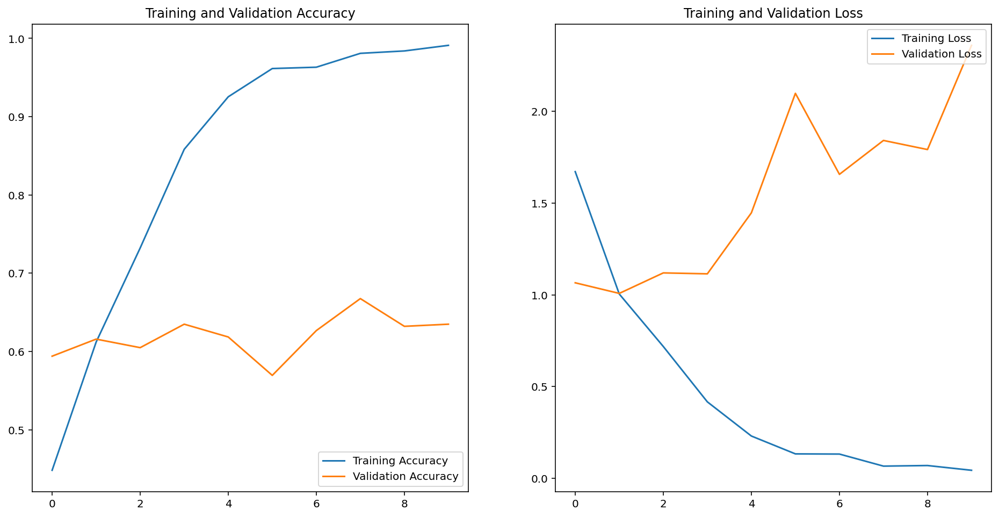

In [23]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [24]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[6.78483548e-06, 2.43350678e-05, 5.77703007e-02, 3.12183857e-01,
        6.30014718e-01],
       [1.00000000e+00, 5.51741941e-08, 1.73019099e-10, 1.13452758e-16,
        7.02266301e-11],
       [4.12351750e-02, 1.78809642e-05, 9.97974304e-04, 9.57684994e-01,
        6.39173595e-05],
       [2.03271508e-01, 7.45349169e-01, 8.12370144e-03, 9.07594924e-08,
        4.32555936e-02],
       [9.96761620e-01, 2.77732802e-03, 9.44875137e-06, 3.79403573e-05,
        4.13612492e-04],
       [9.93286192e-01, 4.10303968e-04, 2.58013280e-03, 1.79208782e-05,
        3.70554347e-03],
       [1.78862081e-07, 2.72125192e-03, 9.96984065e-01, 3.76676361e-08,
        2.94461934e-04],
       [2.76090484e-03, 3.16204532e-05, 7.12828012e-03, 8.19331234e-08,
        9.90079165e-01],
       [1.42768954e-06, 6.56121370e-13, 7.11633241e-09, 9.99998569e-01,
        8.04507589e-12],
       [1.00000000e+00, 1.21752775e-09, 2.21101327e-12, 5.73433258e-15,
        9.32713573e-10],
       [9.99916196e-01, 1.7705

In [25]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([4, 0, 3, 1, 0, 0, 2, 4, 3, 0, 0, 0, 3, 2, 0, 3, 2, 0, 0, 4, 2, 0,
       2, 0, 1, 3, 2, 1, 2, 1, 0, 4])

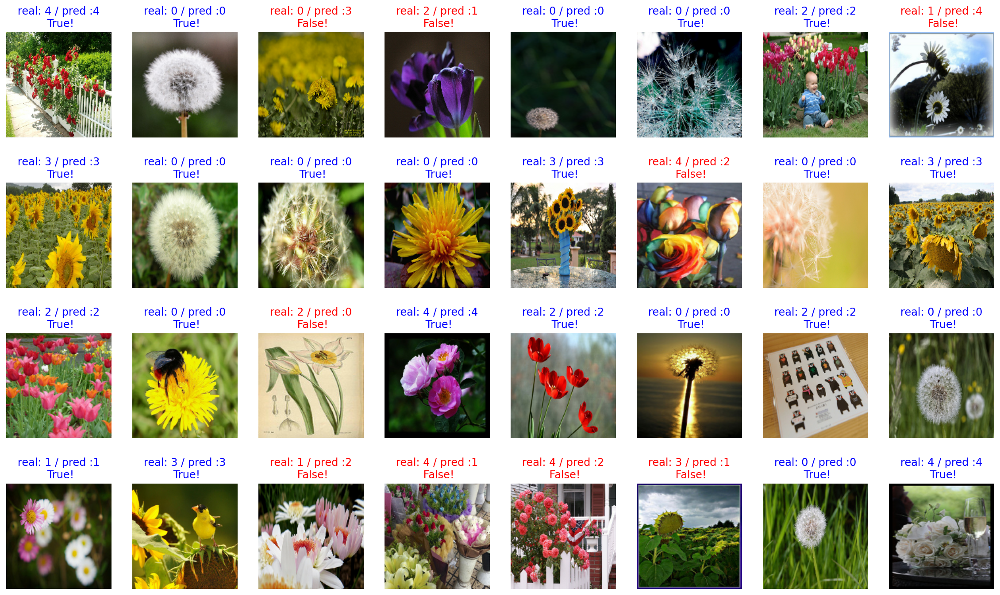

In [26]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [27]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1


print(count / 32 * 100)    # 약 70% 내외

71.875


In [28]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [29]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [30]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [31]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [32]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [33]:
import numpy as np

image = np.array([[1, 2],
                  [3, 4]])

flattened_image = image.flatten()

print("Original image:\n", image)
print("Original image shape:", image.shape)
print()
print("Flattened image:\n", flattened_image)
print("Flattened image shape:", flattened_image.shape)

Original image:
 [[1 2]
 [3 4]]
Original image shape: (2, 2)

Flattened image:
 [1 2 3 4]
Flattened image shape: (4,)


In [34]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [35]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [51]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 5)


In [52]:
base_model.trainable = False

In [53]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

In [54]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_5 (Dense)              (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


In [55]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [56]:
validation_steps=5
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

5/5 [==============================] - 0s 52ms/step - loss: 1.6749 - accuracy: 0.2562
initial loss: 1.67
initial accuracy: 0.26


In [71]:
EPOCHS = 10   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 7s 73ms/step - loss: 0.6439 - accuracy: 0.7987 - val_loss: 0.6287 - val_accuracy: 0.7657
Epoch 2/10
92/92 [==============================] - 7s 73ms/step - loss: 0.6057 - accuracy: 0.8004 - val_loss: 0.6080 - val_accuracy: 0.7847
Epoch 3/10
92/92 [==============================] - 7s 73ms/step - loss: 0.5771 - accuracy: 0.8144 - val_loss: 0.5826 - val_accuracy: 0.7984
Epoch 4/10
92/92 [==============================] - 7s 74ms/step - loss: 0.5525 - accuracy: 0.8219 - val_loss: 0.5803 - val_accuracy: 0.7875
Epoch 5/10
92/92 [==============================] - 7s 74ms/step - loss: 0.5320 - accuracy: 0.8283 - val_loss: 0.5549 - val_accuracy: 0.8038
Epoch 6/10
92/92 [==============================] - 7s 74ms/step - loss: 0.5147 - accuracy: 0.8362 - val_loss: 0.5402 - val_accuracy: 0.7984
Epoch 7/10
92/92 [==============================] - 7s 74ms/step - loss: 0.4986 - accuracy: 0.8386 - val_loss: 0.5291 - val_accuracy: 0.8147
Epoch 8/10
92

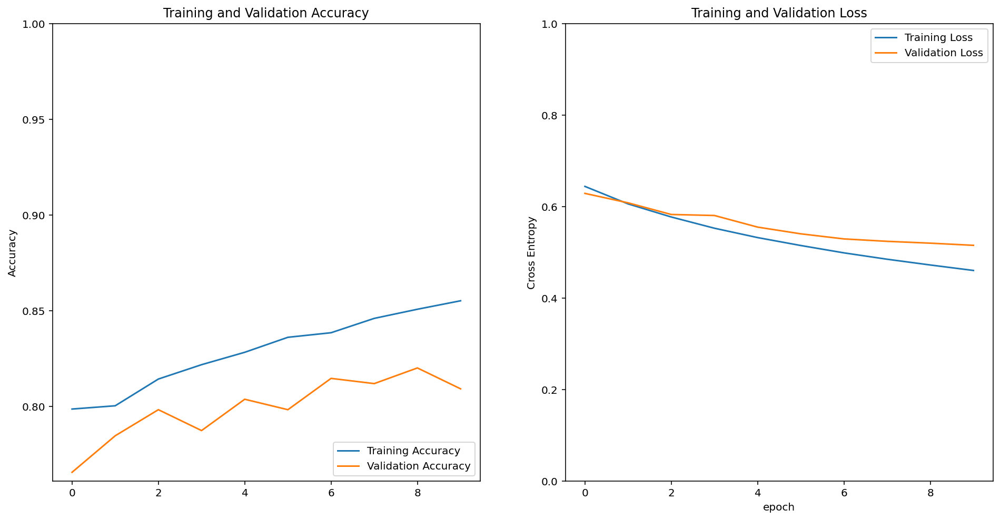

In [72]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [73]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[1.14921881e-02, 5.99414781e-02, 7.17613757e-01, 4.30724323e-02,
        1.67880118e-01],
       [9.99232769e-01, 6.62457431e-04, 5.89191177e-06, 3.26411828e-05,
        6.63994797e-05],
       [7.68232346e-01, 1.18420266e-01, 1.61924418e-02, 7.51929358e-02,
        2.19619591e-02],
       [1.50088733e-03, 8.27702414e-03, 5.46223998e-01, 4.55168216e-03,
        4.39446419e-01],
       [6.35816038e-01, 3.15168113e-01, 1.31299766e-02, 1.09617291e-02,
        2.49241199e-02],
       [9.38633800e-01, 4.03329991e-02, 2.95781274e-03, 1.65496394e-02,
        1.52566924e-03],
       [9.33933258e-03, 1.36201503e-02, 8.16944540e-01, 9.84339938e-02,
        6.16619587e-02],
       [4.08300698e-01, 4.82734889e-01, 9.30748240e-04, 1.03863865e-01,
        4.16987250e-03],
       [9.65608563e-03, 1.88318035e-03, 2.51423828e-02, 8.77978444e-01,
        8.53399709e-02],
       [9.99404788e-01, 5.50809200e-04, 1.11899828e-06, 4.06988947e-05,
        2.59029594e-06],
       [9.70383465e-01, 2.4321

In [74]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 3, 3, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       1, 0, 1, 3, 2, 4, 4, 3, 0, 4])

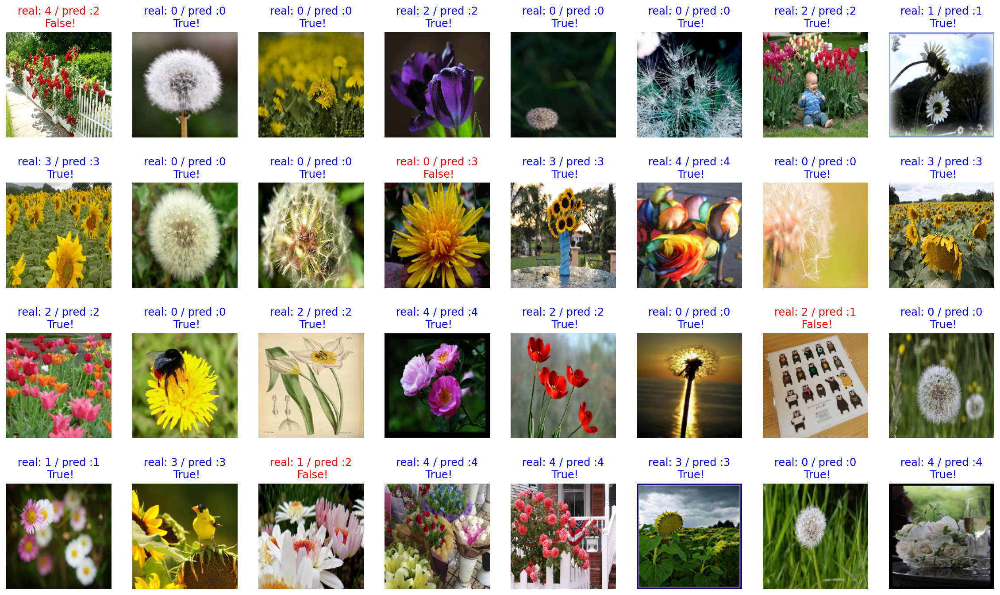

In [75]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [76]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

87.5


In [77]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


In [78]:
img_dir_path = os.getenv("HOME") + "/aiffel/cat_vs_dog/images"
os.path.exists(img_dir_path)

True

In [79]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

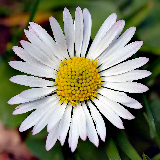

In [80]:
IMG_SIZE = 160
dog_image_path = os.path.join(img_dir_path, 'my_flower.jpeg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

In [81]:
dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [82]:
prediction = model.predict(dog_image)
prediction

array([[0., 1., 0., 0., 0.]], dtype=float32)

In [83]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    dandelion_percentage = round(prediction[0] * 100)
    daisy_percentage = round(prediction[1] * 100)
    tulip_percentage = round(prediction[2] * 100)
    sunflower_percentage = round(prediction[3] * 100)
    rose_percentage = round(prediction[4] * 100)
    print(f"This image seems {dandelion_percentage}% dandelion, and {daisy_percentage}% daisy, and {tulip_percentage}% tulip, and {sunflower_percentage}% sunflower, and {rose_percentage}% rose.")

This image seems 0.0% dandelion, and 100.0% daisy, and 0.0% tulip, and 0.0% sunflower, and 0.0% rose.


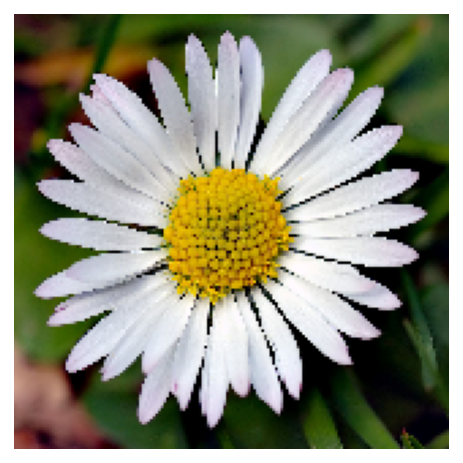

In [84]:
filename = 'my_flower.jpeg'

show_and_predict_image(img_dir_path, filename)